#  <center> <font color='teal'>**Sakina_Ariwala_Mini_Project_Classification**</font>

# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**Project Description**</font>

**<center>House Grade Classification** <center/>

              Property buyers have different requirements. To facilitate this, real estate companies prefer categorizing various houses into different grades based on various parameters. This would help agents in identifying the type of house a    customer is looking for. This way, the search for the house can be narrowed down by focusing only on the condition of the house'.
              The Grade (condition of the house that ranges from A (Best) – E (Worst)) can also be used by existing owners to list their properties for sale. Grading helps them in arriving at a price of the house.

**<center> Business Goal** <center/>
    
           Build a predictive model to determine the Grade of house (The grade are A,B,C,D and E)

# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**Importing Libraries**</font>

In [1]:
import numpy as np
import pandas as pd
from numpy import mean, std

#for plotting graphs
import seaborn as sns  
import matplotlib.pyplot as plt

#Preprocessing
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold, RepeatedStratifiedKFold, cross_val_score, GridSearchCV

#Classification Models
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier,StackingClassifier
from sklearn.naive_bayes import GaussianNB

#Checking Accuracy
from sklearn.metrics import f1_score, accuracy_score, precision_score,recall_score,confusion_matrix
from sklearn.metrics import classification_report
from collections import Counter

import warnings
warnings.filterwarnings("ignore")

# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**Data Preprocessing**</font>

In [2]:
df = pd.read_csv("DS3_C6_S2_Classification_HouseGrade_Data_Project.csv")
df.head()

,Id,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,roof,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price,Grade
0,1,339,6,5,4,6,NO,0,76,2,79,6,3481,D
1,2,358,5,4,3,4,YES,71,96,3,72,4,3510,D
2,3,324,7,5,4,5,YES,101,117,5,64,3,3748,C
3,4,330,6,4,3,5,YES,101,82,2,59,2,3134,D
4,5,320,7,4,4,5,NO,0,75,3,40,1,3843,D


In [98]:
from pandas_profiling import ProfileReport

In [7]:
profile = ProfileReport(df, title="House Grade Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
print("\033[1;36mRow's in the dataset:\033[0m",df.shape[0])
print("\033[1;36mColumn's in the dataset:\033[0m", df.shape[1])

Row's in the dataset: 3000
Column's in the dataset: 14


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Id              3000 non-null   int64 
 1   Area(total)     3000 non-null   int64 
 2   Trooms          3000 non-null   int64 
 3   Nbedrooms       3000 non-null   int64 
 4   Nbwashrooms     3000 non-null   int64 
 5   Twashrooms      3000 non-null   int64 
 6   roof            3000 non-null   object
 7   Roof(Area)      3000 non-null   int64 
 8   Lawn(Area)      3000 non-null   int64 
 9   Nfloors         3000 non-null   int64 
 10  API             3000 non-null   int64 
 11  ANB             3000 non-null   int64 
 12  Expected price  3000 non-null   int64 
 13  Grade           3000 non-null   object
dtypes: int64(12), object(2)
memory usage: 328.2+ KB


In [5]:
df.describe()

,Id,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.00000,3000.000000
mean,1500.500000,325.117000,7.021667,5.023000,4.513667,6.010667,48.980667,95.609333,4.013333,70.190667,3.47900,3782.938333
std,866.169729,20.507742,1.421221,1.634838,1.715263,1.786136,48.746641,14.837388,1.621532,17.563460,1.69426,567.189995
min,1.000000,290.000000,5.000000,2.000000,1.000000,2.000000,0.000000,70.000000,1.000000,40.000000,1.00000,2504.000000
25%,750.750000,308.000000,6.000000,4.000000,3.000000,5.000000,0.000000,83.000000,3.000000,55.000000,2.00000,3354.000000
50%,1500.500000,325.000000,7.000000,5.000000,4.000000,6.000000,71.000000,96.000000,4.000000,70.000000,4.00000,3771.000000
75%,2250.250000,343.000000,8.000000,6.000000,6.000000,7.000000,96.000000,109.000000,5.000000,85.000000,5.00000,4208.000000
max,3000.000000,360.000000,9.000000,8.000000,8.000000,10.000000,120.000000,120.000000,7.000000,100.000000,6.00000,5216.000000


In [6]:
df.isnull().sum()

Id                0
Area(total)       0
Trooms            0
Nbedrooms         0
Nbwashrooms       0
Twashrooms        0
roof              0
Roof(Area)        0
Lawn(Area)        0
Nfloors           0
API               0
ANB               0
Expected price    0
Grade             0
dtype: int64

In [12]:
!pip install missingno

In [13]:
import missingno as msno #Visual representation of any missing value 

<AxesSubplot:>

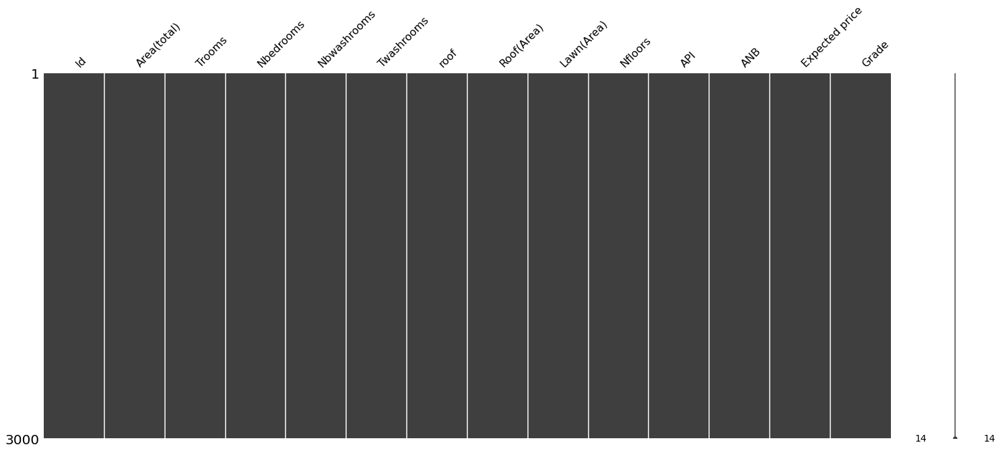

In [14]:
msno.matrix(df) #There's no missing value

In [7]:
df.nunique()

Id                3000
Area(total)         71
Trooms               5
Nbedrooms            7
Nbwashrooms          8
Twashrooms           9
roof                 2
Roof(Area)          52
Lawn(Area)          51
Nfloors              7
API                 61
ANB                  6
Expected price    1647
Grade                5
dtype: int64

In [8]:
for i in df.columns:
    print(df[i].unique())

[   1    2    3 ... 2998 2999 3000]
[339 358 324 330 320 314 332 323 351 308 309 303 321 345 307 337 333 343
 322 326 329 292 298 296 354 318 301 352 348 304 336 355 299 349 310 344
 338 312 328 342 335 359 313 334 300 302 317 306 341 293 294 327 311 347
 290 360 316 295 315 331 305 356 346 357 350 297 325 291 340 353 319]
[6 5 7 8 9]
[5 4 7 8 6 3 2]
[4 3 6 7 5 2 8 1]
[ 6  4  5  7  9  8  3  2 10]
['NO' 'YES']
[  0  71 101  81 103  89  74 116  95  77 118 115  78  87 112  73 111  90
  84 117  93  82 102 113 108 107 110 109 105  96  86  75  98  91 106 100
  97  80  88  85  79  83 104  76 119  72 120 114  94  70  92  99]
[ 76  96 117  82  75  93 120  95  97 111 105 115 109  84  80  83  81 104
 113 112 116 100 107  94  71  77 114  72 119  86  91  74  85 110  70  88
 106  73 103 108 101  79 102  87  92  99 118  90  98  89  78]
[2 3 5 6 1 4 7]
[ 79  72  64  59  40  93  87  82  44  89  62  45  73  49  90  46  96  41
  95  78  81  50  42  43  83  84  66  94  70  80  67  69  60  99  97  77
  53 

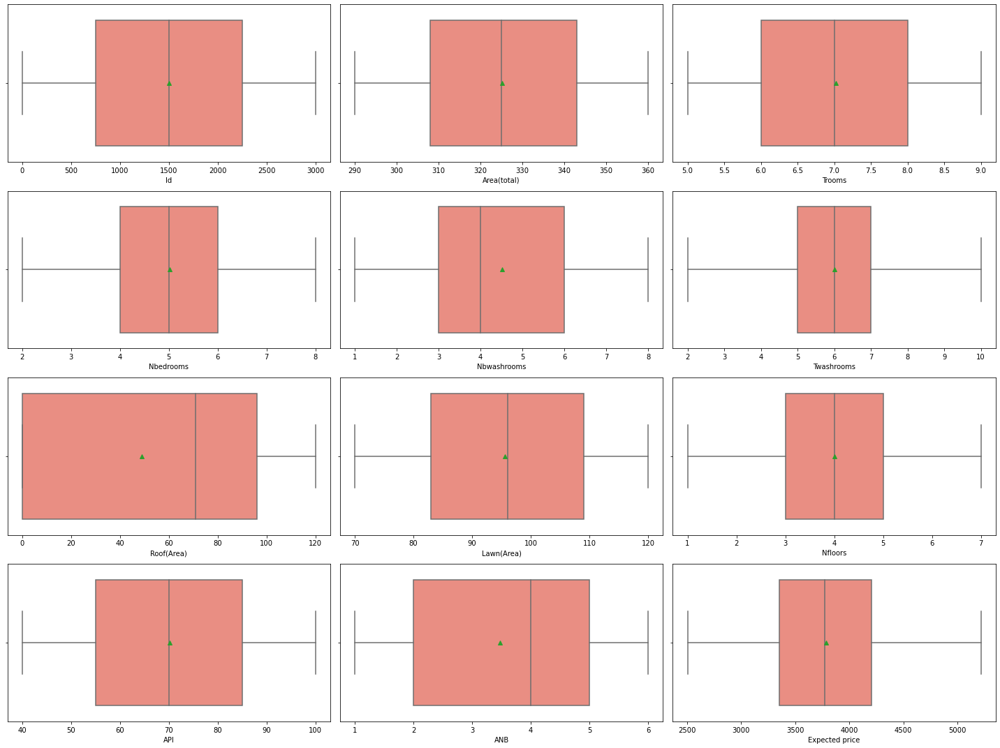

In [44]:
cols = 3
rows = 4
num_cols = df.select_dtypes(exclude='object').columns
fig = plt.figure(figsize= (20,15))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot( rows, cols, i+1)
    
    sns.boxplot(x=df[col], ax=ax,color="salmon",showmeans=True)
    
fig.tight_layout()  
plt.show()

In [83]:
df.skew()

Id                0.000000
Area(total)      -0.003584
Trooms            0.008511
Nbedrooms         0.048713
Nbwashrooms       0.064233
Twashrooms        0.040511
Roof(Area)        0.078216
Lawn(Area)       -0.054065
Nfloors           0.001454
API              -0.012462
ANB              -0.003799
Expected price    0.090646
dtype: float64

### Interpretation
- **From the Graphs we can observe none of the features are extremely skewed apart from roof(area) which is right skewed**

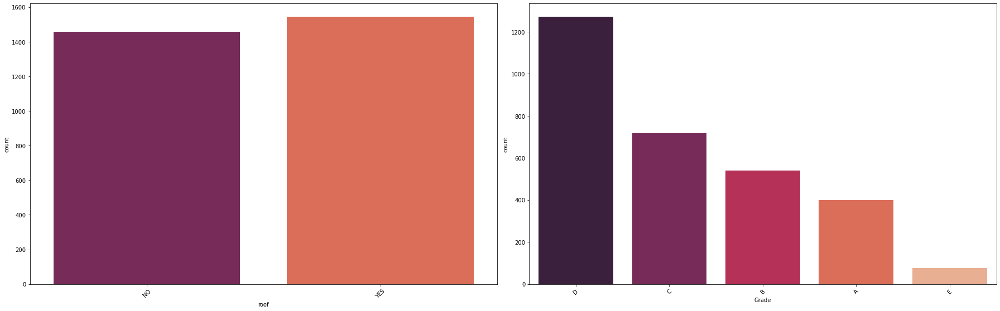

In [34]:
cols = 2
rows = 2
num_cols = df.select_dtypes(include='object').columns
fig = plt.figure(figsize= (25,15))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot(rows, cols, i+1)
    
    sns.countplot(x=df[col], ax=ax,palette="rocket")
    plt.xticks(rotation=45)
    
fig.tight_layout()  
plt.show()

### Interpretation
- **More than 1400 houses provide Roof**
- **Grade D houses have count more than 1200 and Grade E houses have the least count**

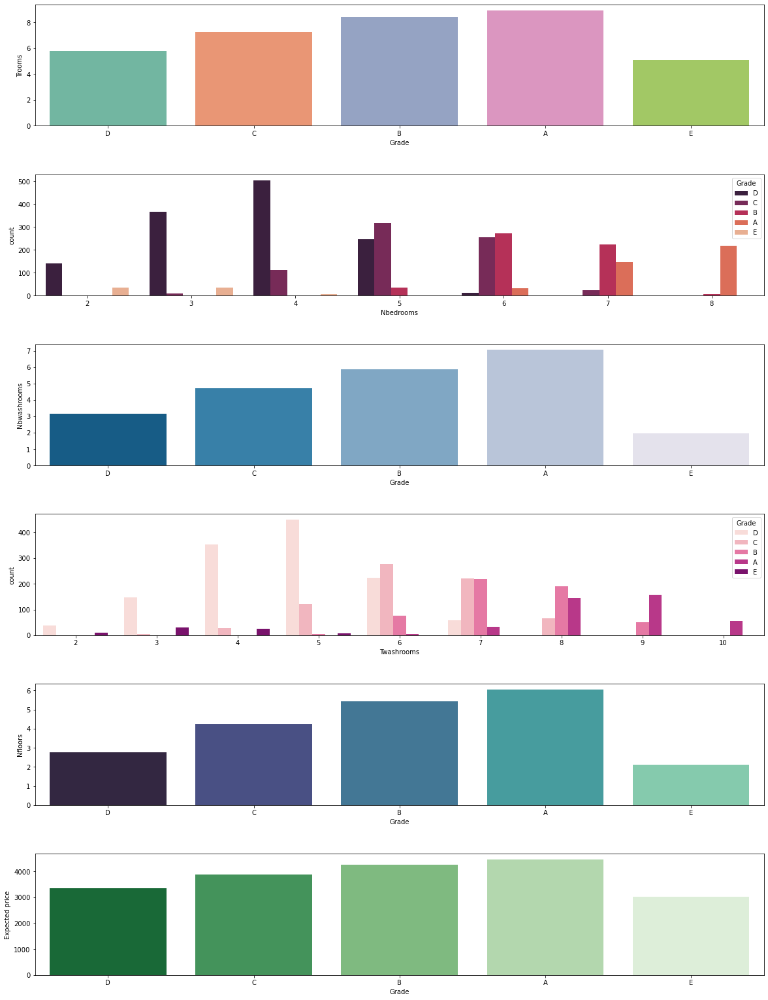

In [41]:
plt.figure(figsize = (20,15))

plt.subplot(611)
sns.barplot(x='Grade', y='Trooms', data=df, palette="Set2",ci=None)

plt.subplot(612)
sns.countplot(hue='Grade', x='Nbedrooms', data=df, palette="rocket")

plt.subplot(613)
sns.barplot(x='Grade', y='Nbwashrooms', data=df, palette="PuBu_r",ci=None)

plt.subplot(614)
sns.countplot(hue='Grade', x='Twashrooms', data=df, palette="RdPu")

plt.subplot(615)
sns.barplot(x='Grade', y='Nfloors', data=df, palette="mako",ci=None)

plt.subplot(616)
sns.barplot(y="Expected price",x="Grade",data=df,ci=None,palette="Greens_r")

plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 1.5)

plt.show()

### Interpretation
- **Grade A provides more than 8 rooms**
- **Grade D have the highest count for 4 bedrooms and only Grade D Provides 2 bedrooms**
- **Grade A provides 7 bathrooms and Grade E provides upto 2 bathrooms**
- **Grade D has the highest count for 5 washrooms and only Grade D provides 2 washrooms**
- **Grade A has houses till 6 floors and Grade E provides houses till 2 floors**
- **Expected Prices for Grade A houses are upto 4000 and Grade E houses expected prices are less than 3000**

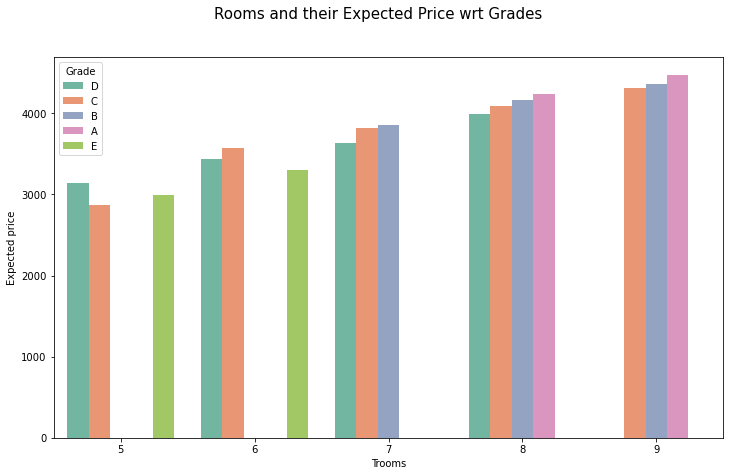

In [92]:
plt.figure(figsize=(12,7))
sns.barplot(y="Expected price",x="Trooms",hue="Grade",data=df,ci=None,palette="Set2")
plt.suptitle("Rooms and their Expected Price wrt Grades",fontsize=15)
plt.show()

### Interpretation
- **Only Grade D and C houses provide 5 rooms and their expected prices are approx from 2800 to 3200**
- **Grade E only has houses with 5 and 6 rooms with prices ranging from 3000 to 3300**
- **Grade A only has houses with 8 to 9 rooms with prices more than 4000**

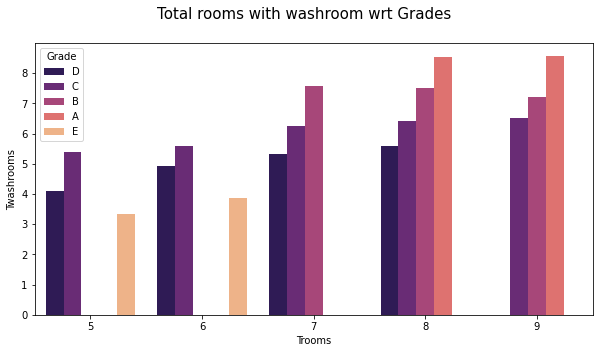

In [82]:
plt.figure(figsize=(10,5))
sns.barplot(y="Twashrooms",x="Trooms",hue="Grade",data=df,ci=None,palette="magma")
plt.suptitle("Total rooms with washroom wrt Grades",fontsize=15)
plt.show()

### Interpretation
- **Grade E has 5 to 6 rooms with 3 to 4 bathrooms**
- **Grade C houses provides 5 to 9 rooms with more than 5 washrooms**
- **Grade A houses provides 8 to 9 with upto 8 washrooms**

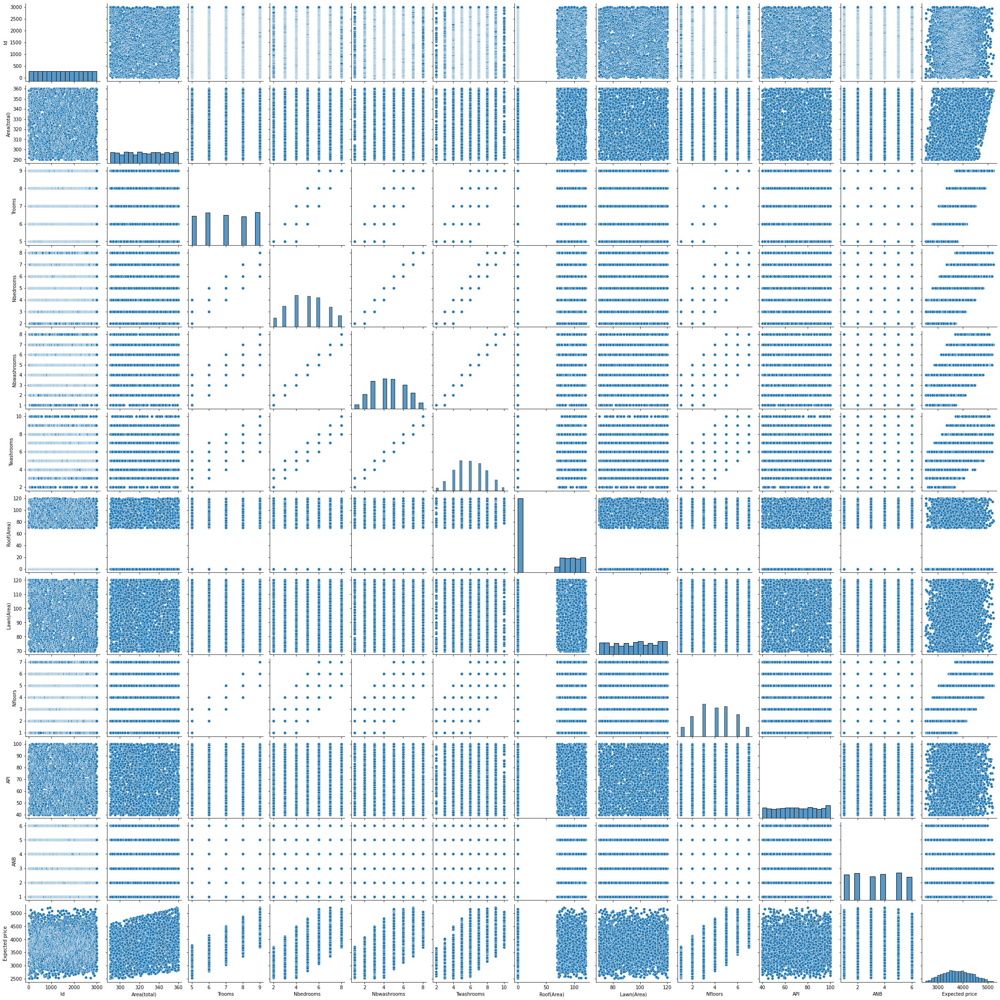

In [9]:
sns.pairplot(df)

In [3]:
objs = [x for x in df.columns if df[x].dtypes== "object"]
objs

['roof', 'Grade']

In [4]:
for i in objs:
    df[i] = df[i].astype("category")

In [5]:
df.dtypes

Id                   int64
Area(total)          int64
Trooms               int64
Nbedrooms            int64
Nbwashrooms          int64
Twashrooms           int64
roof              category
Roof(Area)           int64
Lawn(Area)           int64
Nfloors              int64
API                  int64
ANB                  int64
Expected price       int64
Grade             category
dtype: object

In [6]:
encoder = LabelEncoder()
for i in df:
    if i in objs:
        df[i+'_encoded'] = encoder.fit_transform(df[i])
        df.drop(i, axis=1, inplace=True)
df.head()

,Id,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price,roof_encoded,Grade_encoded
0,1,339,6,5,4,6,0,76,2,79,6,3481,0,3
1,2,358,5,4,3,4,71,96,3,72,4,3510,1,3
2,3,324,7,5,4,5,101,117,5,64,3,3748,1,2
3,4,330,6,4,3,5,101,82,2,59,2,3134,1,3
4,5,320,7,4,4,5,0,75,3,40,1,3843,0,3


In [7]:
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df.to_numpy()), columns=df.columns)

In [98]:
df_scaled

,Id,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price,roof_encoded,Grade_encoded
0,-1.731474,0.677077,-0.718985,-0.014071,-0.299518,-0.005973,-1.004968,-1.321837,-1.241831,0.501655,1.488214,-0.532429,-1.029090,0.874159
1,-1.730319,1.603710,-1.422722,-0.625854,-0.882616,-1.125895,0.451785,0.026334,-0.625028,0.103034,0.307560,-0.481292,0.971733,0.874159
2,-1.729164,-0.054476,-0.015248,-0.014071,-0.299518,-0.565934,1.067315,1.441914,0.608580,-0.352533,-0.282766,-0.061609,0.971733,-0.025490
3,-1.728009,0.238145,-0.718985,-0.625854,-0.882616,-0.565934,1.067315,-0.917385,-1.241831,-0.637262,-0.873093,-1.144319,0.971733,0.874159
4,-1.726855,-0.249557,-0.015248,-0.625854,-0.299518,-0.565934,-1.004968,-1.389245,-0.625028,-1.719234,-1.463420,0.105911,-1.029090,0.874159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,1.726855,0.774617,1.392227,0.597712,0.283580,0.553988,0.944209,1.307097,0.608580,1.128060,-0.873093,0.816550,0.971733,-0.925139
2996,1.728009,-1.615123,1.392227,1.821279,1.449776,1.113949,1.375079,-0.580343,1.842187,1.526681,0.307560,-0.052792,0.971733,-1.824789
2997,1.729164,0.140604,-0.015248,-0.625854,-0.882616,-0.565934,-1.004968,-1.187019,0.608580,1.412789,1.488214,-0.310245,-1.029090,0.874159
2998,1.730319,-1.566353,1.392227,1.209496,1.449776,1.113949,-1.004968,-1.187019,1.842187,-1.092829,-0.282766,0.731908,-1.029090,-0.925139


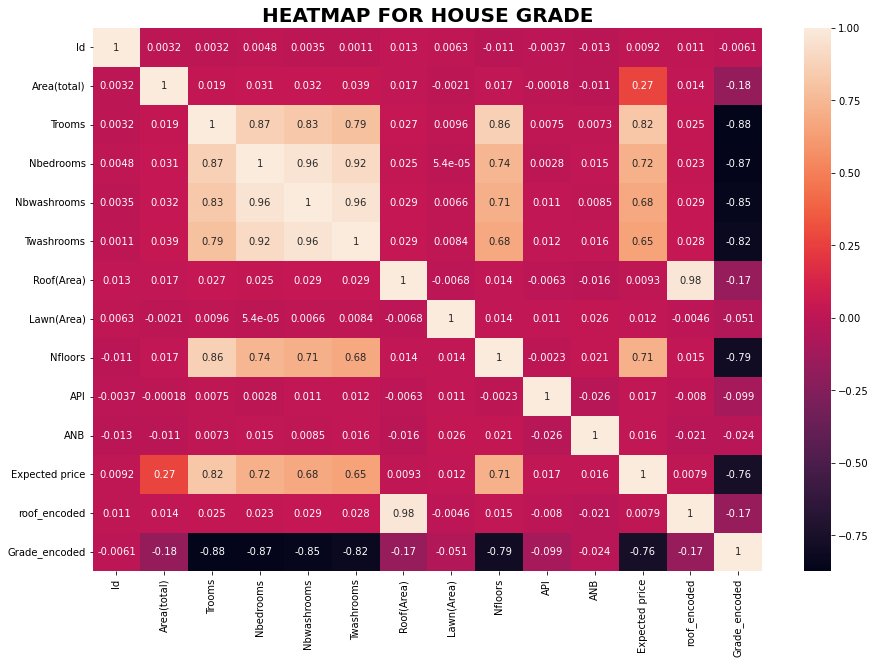

In [11]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True)
plt.title('HEATMAP FOR HOUSE GRADE', fontweight='bold', size=20)
plt.show()

- **FEATURES HIGHLY CORRELATED WITH GRADE**
- TROOMS
- NBEDROOMS 
- NBWASHROOMS
- TWASHROOMS
- NFLOORS
- EXPECTED PRICE 

# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**Splitting the data into X and y**</font>

In [8]:
X = df.drop(["Grade_encoded","Id"],axis=1)
y = df["Grade_encoded"]

In [9]:
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=50)

# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**Logistic Regression Model**</font>

In [10]:
lr_model = LogisticRegression().fit(x_train,y_train)

In [11]:
y_pred = lr_model.predict(x_test)
print("Predicted Response:-",y_pred)

Predicted Response:- [2 2 3 2 2 3 1 3 0 3 0 3 3 2 3 3 2 3 3 3 2 3 1 3 2 1 0 3 2 3 2 0 0 3 3 0 0
 1 3 3 3 3 3 2 1 2 3 0 1 1 3 0 3 3 1 0 0 3 2 3 0 3 3 2 3 1 3 1 2 0 2 1 2 3
 3 3 2 3 0 1 1 3 2 2 2 3 1 3 3 0 3 3 3 3 1 3 3 3 0 3 3 0 3 3 3 0 1 0 1 3 3
 1 3 3 3 0 3 3 3 2 3 3 2 3 3 3 2 3 2 0 1 3 3 0 1 1 3 2 1 3 3 3 3 2 3 3 0 3
 1 1 3 3 1 3 3 0 3 3 2 3 3 3 1 2 2 0 3 2 0 2 1 3 3 3 3 1 3 2 2 1 2 0 0 0 2
 1 1 3 2 0 2 1 3 3 3 2 0 1 2 1 3 0 0 2 3 3 0 3 3 0 3 3 1 3 1 2 3 3 1 3 0 2
 3 2 2 2 0 3 3 3 0 3 3 3 3 3 2 0 1 3 1 3 3 0 3 3 0 0 3 0 3 0 3 1 3 0 3 3 3
 0 3 3 2 3 1 3 3 3 3 0 2 0 3 3 2 3 3 0 1 3 1 2 3 3 3 3 2 3 3 3 0 3 3 3 0 3
 3 3 3 3 3 3 0 2 1 3 3 0 0 3 3 1 2 3 0 3 0 2 0 2 3 0 3 2 3 3 2 1 0 0 3 3 3
 2 3 3 0 3 3 0 2 2 2 2 3 2 3 2 0 2 0 3 0 3 3 1 1 1 3 3 1 2 3 0 3 3 3 3 2 3
 2 2 1 1 3 2 0 3 3 0 0 3 3 3 1 3 1 3 0 0 0 3 0 3 0 1 3 2 0 3 3 3 2 3 3 3 2
 0 1 3 0 3 2 2 2 1 2 3 0 1 3 1 3 3 1 1 3 3 3 2 3 2 2 2 3 1 3 3 0 3 3 2 0 1
 3 3 3 3 2 3 1 2 2 3 3 3 0 3 3 0 3 3 3 1 3 3 3 3 2 3 3 3 2 0 0 3 3 3 3 2 3
 3 3

In [21]:
def metrics(lr_model):
    cr = classification_report(y_test,y_pred)
    print("\033[1;3mClassification Report:\033[0m\n",cr)
    print("◂⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯▸")
    cm = confusion_matrix(y_test,y_pred)
    print("\033[1;3mConfusion Matrix:\033[0m\n",cm)

In [22]:
metrics(lr_model)

Classification Report:
               precision    recall  f1-score   support

           0       0.39      0.52      0.45        75
           1       0.34      0.24      0.28       113
           2       0.30      0.24      0.27       142
           3       0.68      0.83      0.75       253
           4       0.00      0.00      0.00        17

    accuracy                           0.52       600
   macro avg       0.34      0.37      0.35       600
weighted avg       0.47      0.52      0.49       600

◂⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯▸
Confusion Matrix:
 [[ 39  24  12   0   0]
 [ 40  27  33  13   0]
 [ 18  21  34  69   0]
 [  2   8  33 210   0]
 [  0   0   0  17   0]]


In [110]:
np.unique(y_test)

array([0, 1, 2, 3, 4])

In [111]:
def right_pred(y_pred):
    a=0
    b=1
    c=2
    d=3
    e=4
    f=Counter(y_pred)
    print('{} has occurred {} times'.format(a, f[a]))
    print('{} has occurred {} times'.format(b, f[b]))
    print('{} has occurred {} times'.format(c, f[c]))
    print('{} has occurred {} times'.format(d, f[d]))
    print('{} has occurred {} times'.format(e, f[e]))

In [112]:
y_test.value_counts()

3    253
2    142
1    113
0     75
4     17
Name: Grade_encoded, dtype: int64

In [113]:
right_pred(y_pred)

0 has occurred 99 times
1 has occurred 80 times
2 has occurred 112 times
3 has occurred 309 times
4 has occurred 0 times


#### Modeling with cv

In [114]:
results, names = list(),list()

In [115]:
lr_cv = LogisticRegression()

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=50)
n_scores = cross_val_score(lr_cv, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')

results.append(n_scores)
names.append('LR_Model')


s = mean(n_scores)
s

0.5458333333333333

# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**GausianNB Model**</font>

In [116]:
nb_model = GaussianNB().fit(x_train,y_train)

In [117]:
y_pred = nb_model.predict(x_test)
print("Predicted Response:",y_pred)

Predicted Response: [3 1 3 2 1 3 1 3 1 3 0 3 3 1 2 2 0 3 3 3 1 2 1 2 0 0 1 3 2 3 2 0 0 3 3 1 1
 2 3 2 2 4 3 0 0 1 3 0 1 2 2 0 3 3 2 1 1 3 2 3 1 3 3 3 3 0 3 2 2 1 2 0 3 2
 3 3 2 3 1 0 1 3 2 0 3 4 1 3 3 1 2 4 3 3 1 4 2 3 1 1 3 1 2 2 2 1 1 1 1 2 3
 0 2 3 3 0 3 3 3 1 2 3 2 2 3 3 2 4 1 0 2 3 3 1 1 0 3 3 1 3 4 2 3 2 2 3 1 1
 1 0 3 2 1 3 4 1 4 3 0 3 3 2 0 3 2 2 2 3 1 3 2 3 3 2 3 3 2 1 1 0 2 0 0 0 2
 0 0 2 1 1 2 1 3 2 3 3 2 1 2 1 3 2 1 3 3 2 0 3 3 1 2 3 0 3 2 2 3 2 1 3 0 2
 3 1 0 1 1 3 3 3 1 2 3 3 2 3 2 1 0 3 0 3 2 0 4 3 0 1 3 1 3 0 3 0 3 0 2 1 3
 1 2 3 2 3 1 3 1 3 3 1 1 1 2 3 2 3 3 1 1 4 2 3 3 3 3 4 2 1 2 3 1 1 3 3 0 3
 3 3 3 4 2 2 0 1 2 3 2 1 1 3 3 1 3 3 1 2 0 3 1 3 2 1 3 2 3 3 3 2 1 2 3 3 3
 3 3 3 2 4 3 0 1 0 2 2 1 2 3 1 0 1 0 3 1 2 3 1 2 1 1 1 2 2 3 0 3 3 3 1 2 3
 2 1 2 0 3 0 0 2 3 1 0 3 3 4 1 3 2 3 0 0 1 3 2 3 2 1 3 2 0 3 2 3 1 2 3 3 3
 1 2 3 1 3 2 2 1 0 1 2 1 0 3 2 2 2 0 1 4 3 2 1 2 2 2 2 3 0 3 4 2 3 3 1 2 0
 3 3 3 2 3 3 1 2 2 3 1 4 0 2 2 1 3 3 3 2 3 2 3 3 3 2 2 2 2 1 2 3 4 3 2 1 3
 3 2 

In [118]:
metrics(nb_model)

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.81      0.85        75
           1       0.72      0.83      0.77       113
           2       0.65      0.73      0.69       142
           3       0.92      0.79      0.85       253
           4       0.64      0.82      0.72        17

    accuracy                           0.79       600
   macro avg       0.76      0.80      0.77       600
weighted avg       0.80      0.79      0.79       600

◂⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯▸
Confusion Matrix:
 [[ 61  14   0   0   0]
 [  8  94  11   0   0]
 [  0  23 104  15   0]
 [  0   0  46 199   8]
 [  0   0   0   3  14]]


In [119]:
right_pred(y_pred)

0 has occurred 69 times
1 has occurred 131 times
2 has occurred 161 times
3 has occurred 217 times
4 has occurred 22 times


In [120]:
y_test.value_counts()

3    253
2    142
1    113
0     75
4     17
Name: Grade_encoded, dtype: int64

#### Modeling with cv

In [121]:
nb_cv = GaussianNB()

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=50)
n_scores = cross_val_score(nb_cv, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')

results.append(n_scores)
names.append('NB_Model')


s2 = mean(n_scores)
s2

0.8019999999999999

# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**Decision Tree Classifier Model**</font>

In [122]:
dt_model = DecisionTreeClassifier(max_depth=6,max_leaf_nodes=10,min_samples_split=4).fit(x_train,y_train)

In [123]:
y_pred = dt_model.predict(x_test)
print("Predicted Response:",y_pred)

Predicted Response: [3 0 3 2 1 3 1 3 1 3 0 3 3 1 3 3 0 3 3 3 2 2 1 2 0 0 1 3 2 3 2 0 0 3 3 2 1
 2 3 2 2 3 3 0 0 1 3 0 2 2 2 0 3 3 2 1 0 3 2 3 2 3 3 3 3 0 3 2 2 2 2 0 3 3
 3 3 3 3 1 0 1 2 2 0 3 3 1 3 3 1 2 3 3 3 1 3 2 3 0 1 2 0 3 3 2 1 1 0 1 2 3
 0 2 3 3 0 3 3 3 1 2 3 3 2 3 3 2 3 1 0 2 3 3 1 1 0 3 3 0 3 3 2 3 3 3 2 2 1
 1 0 3 2 1 3 3 1 3 3 0 3 3 2 0 3 3 2 2 3 1 3 2 3 3 2 3 3 2 1 1 0 3 0 0 0 2
 0 0 2 2 1 3 1 3 2 3 3 2 2 2 0 3 2 2 3 3 2 0 3 3 1 2 3 0 3 2 2 3 2 2 2 0 3
 3 1 0 2 2 3 3 3 1 3 3 3 2 3 2 2 0 2 0 3 3 0 3 3 0 0 3 1 3 0 3 0 3 0 2 2 3
 2 2 3 3 3 1 3 1 3 3 1 2 0 2 3 3 3 3 1 1 3 3 3 3 3 3 3 2 2 3 3 1 2 3 3 0 3
 3 3 3 3 2 2 0 1 2 3 3 2 1 3 3 1 3 3 1 3 0 3 1 3 2 0 3 2 3 3 3 2 1 2 3 3 2
 3 3 3 2 3 3 0 1 0 2 2 1 3 3 1 0 1 0 3 1 2 3 1 2 2 2 1 2 2 3 0 3 3 3 2 2 3
 2 1 2 0 3 0 0 2 3 1 0 3 2 3 2 3 2 3 0 0 1 3 2 3 2 1 3 2 0 3 2 3 2 2 3 3 3
 1 2 3 1 3 2 2 2 0 1 2 2 0 3 2 2 2 0 2 3 3 2 1 3 3 2 2 3 0 3 3 2 3 3 1 2 0
 3 3 3 2 3 3 0 2 2 3 2 3 0 2 2 1 3 3 3 2 3 2 2 3 3 2 2 3 2 1 2 3 3 3 3 1 3
 3 2 

In [124]:
metrics(dt_model)

Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.88      0.84        75
           1       0.78      0.53      0.63       113
           2       0.60      0.77      0.68       142
           3       0.84      0.86      0.85       253
           4       0.00      0.00      0.00        17

    accuracy                           0.76       600
   macro avg       0.61      0.61      0.60       600
weighted avg       0.74      0.76      0.74       600

◂⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯▸
Confusion Matrix:
 [[ 66   9   0   0   0]
 [ 16  60  37   0   0]
 [  0   8 110  24   0]
 [  0   0  36 217   0]
 [  0   0   0  17   0]]


In [125]:
right_pred(y_pred)

0 has occurred 82 times
1 has occurred 77 times
2 has occurred 183 times
3 has occurred 258 times
4 has occurred 0 times


In [126]:
y_test.value_counts()

3    253
2    142
1    113
0     75
4     17
Name: Grade_encoded, dtype: int64

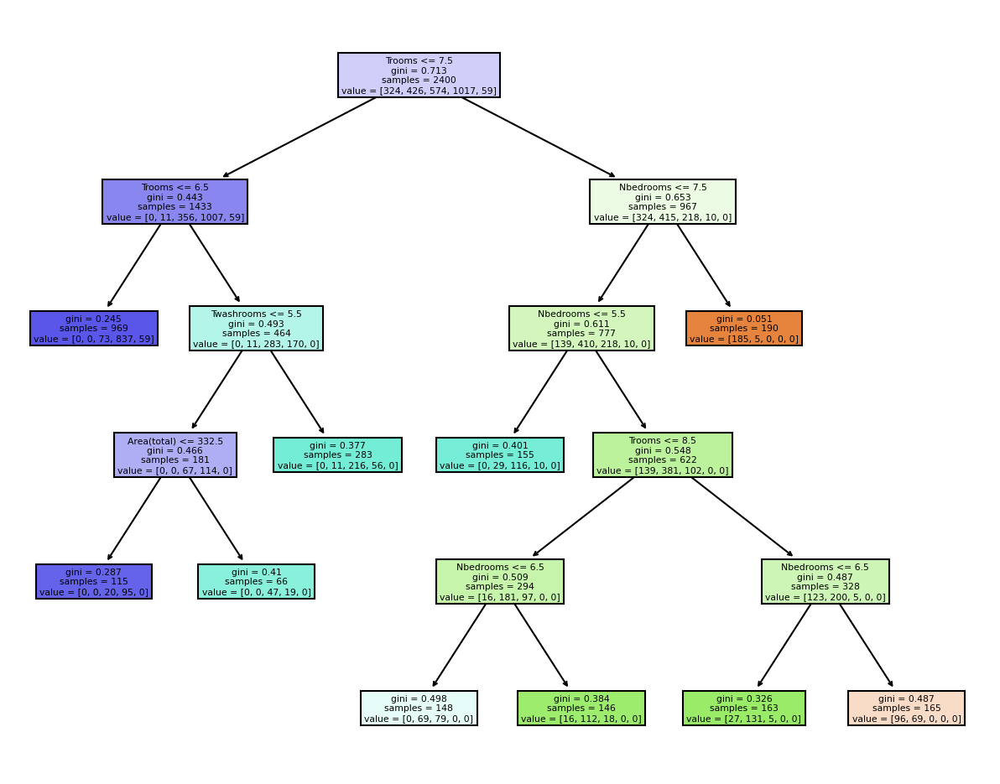

In [127]:
from sklearn.tree import plot_tree 
plt.figure(figsize=(10,8), dpi= 150) 
plot_tree(dt_model, feature_names=X.columns,filled=True)
plt.show()

#### Modeling with cv 

In [128]:
dt_cv = DecisionTreeClassifier()

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=50)
n_scores = cross_val_score(dt_cv, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')

results.append(n_scores)
names.append('DT_Model')


s3 = mean(n_scores)
s3

0.8445

# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**Random Forest Model**</font>

In [129]:
rf_model = RandomForestClassifier(max_depth=5,min_samples_split=3,oob_score=True,n_jobs=-1,random_state=50)

In [130]:
rf_model.fit(x_train,y_train)

RandomForestClassifier(max_depth=5, min_samples_split=3, n_jobs=-1,
                       oob_score=True, random_state=50)

In [131]:
y_pred = rf_model.predict(x_test)
print("Predicted Response :",y_pred)

Predicted Response : [3 1 3 2 1 3 1 3 1 3 0 3 3 1 3 3 0 3 3 3 2 2 1 2 0 0 1 3 2 3 2 0 0 3 3 2 1
 2 3 2 2 3 3 0 0 1 3 0 2 2 2 0 3 3 2 1 1 3 2 3 1 3 3 3 3 0 3 2 2 1 3 0 3 3
 3 3 3 3 1 0 1 3 2 0 3 3 1 3 3 1 2 3 3 3 1 3 2 3 1 1 3 1 3 3 2 1 1 1 1 2 3
 0 2 3 3 1 3 3 3 1 2 3 3 2 3 3 2 3 1 0 2 3 3 1 1 0 3 3 1 3 3 2 3 2 3 3 1 1
 1 0 3 2 1 3 3 1 3 3 0 3 3 2 0 3 2 2 2 3 1 3 2 3 3 2 3 3 2 1 1 0 2 0 0 0 2
 0 0 2 1 1 3 1 3 2 3 3 2 2 2 1 3 2 2 3 3 2 0 3 3 1 2 3 0 3 2 2 3 2 1 3 0 3
 3 1 0 2 1 3 3 3 1 3 3 3 2 3 2 2 0 3 0 3 2 0 3 3 0 1 3 1 3 1 3 0 3 1 3 2 3
 2 2 3 2 3 1 3 1 3 3 1 1 1 2 3 2 3 3 1 1 3 3 3 3 3 3 3 2 1 3 3 1 2 3 3 0 3
 3 3 3 3 2 3 0 1 2 3 3 1 1 3 3 1 3 3 1 3 0 3 1 3 3 1 3 2 3 3 3 2 1 2 3 3 3
 3 3 3 2 3 3 0 1 0 2 2 1 3 3 1 0 1 0 3 1 2 3 1 2 2 2 1 2 3 3 0 3 3 3 2 2 3
 3 1 2 0 3 0 0 2 3 1 0 3 3 3 2 3 2 3 0 0 1 3 2 3 2 1 3 2 0 3 2 3 1 2 3 3 3
 1 2 3 1 3 2 2 1 0 1 2 2 0 3 2 2 3 0 1 3 3 2 1 3 3 2 2 3 0 3 3 2 3 3 1 2 1
 3 3 3 2 3 3 1 2 2 3 2 3 0 2 3 1 3 3 3 2 3 3 3 3 3 2 2 2 2 1 2 3 3 3 3 1 3
 3 2

In [132]:
metrics(rf_model)

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.79      0.84        75
           1       0.78      0.77      0.77       113
           2       0.73      0.76      0.74       142
           3       0.85      0.92      0.88       253
           4       0.00      0.00      0.00        17

    accuracy                           0.81       600
   macro avg       0.65      0.65      0.65       600
weighted avg       0.79      0.81      0.80       600

◂⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯▸
Confusion Matrix:
 [[ 59  16   0   0   0]
 [  6  87  20   0   0]
 [  0   9 108  25   0]
 [  0   0  20 233   0]
 [  0   0   0  17   0]]


In [133]:
print("Oob Score",rf_model.oob_score_)

Oob Score 0.835


In [134]:
right_pred(y_pred)

0 has occurred 65 times
1 has occurred 112 times
2 has occurred 148 times
3 has occurred 275 times
4 has occurred 0 times


In [135]:
y_test.value_counts()

3    253
2    142
1    113
0     75
4     17
Name: Grade_encoded, dtype: int64

### Hyperparameter Tuning for Random Forest

In [152]:
params = {"max_depth" : [2,4,6,8,10,12], "min_samples_leaf" : [5,10,20,50,100,200], 
          "n_estimators" : [10,25,30,50,100,200]}

In [153]:
grid_search = GridSearchCV(estimator=rf_model,param_grid=params,cv = 4,n_jobs=-1, verbose=1, 
                           scoring="neg_mean_squared_error")

In [154]:
grid_search.fit(x_train,y_train)

Fitting 4 folds for each of 216 candidates, totalling 864 fits


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(max_depth=5, min_samples_split=3,
                                              n_jobs=-1, oob_score=True,
                                              random_state=50),
             n_jobs=-1,
             param_grid={'max_depth': [2, 4, 6, 8, 10, 12],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200],
                         'n_estimators': [10, 25, 30, 50, 100, 200]},
             scoring='neg_mean_squared_error', verbose=1)

In [156]:
grid_search.best_score_

-0.12541666666666668

In [157]:
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=3,
                       n_estimators=200, n_jobs=-1, oob_score=True,
                       random_state=50)

In [158]:
rf_model1 = RandomForestClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=3,
                       n_estimators=200, n_jobs=-1, oob_score=True,
                       random_state=50).fit(x_train,y_train)

In [159]:
y_pred1 = rf_model1.predict(x_test)
print("Predicted Response:",y_pred1)

Predicted Response: [3 1 3 2 1 3 1 3 1 3 0 3 3 1 3 3 0 3 3 3 1 2 1 2 0 0 1 3 2 3 2 0 0 3 3 2 1
 2 3 2 2 4 3 0 0 1 3 0 2 2 2 0 3 3 2 1 0 3 2 3 1 3 3 3 3 0 3 3 2 1 2 0 3 3
 3 3 3 3 1 0 1 2 2 0 3 4 2 3 3 1 2 3 3 3 0 3 2 3 1 1 3 1 3 3 2 1 1 1 1 2 3
 0 3 3 3 1 3 3 3 1 2 3 3 2 3 3 3 3 1 0 2 3 3 1 1 0 3 3 1 3 3 2 3 2 3 3 1 1
 1 0 3 2 1 3 4 1 3 3 0 3 3 2 0 3 2 1 2 3 1 3 2 3 3 2 3 3 2 1 1 0 2 0 0 0 2
 0 0 2 1 1 3 1 3 2 3 3 2 2 2 1 3 2 1 3 3 2 0 3 3 1 2 3 0 3 3 2 3 2 1 3 0 3
 3 1 0 2 1 3 3 3 0 2 3 3 2 3 2 2 1 2 0 3 3 0 3 3 0 1 3 1 3 0 3 1 3 0 3 2 3
 1 2 3 2 3 1 3 1 3 3 1 1 1 2 3 2 3 3 1 1 4 3 3 3 3 3 3 2 1 2 3 1 2 3 3 0 3
 3 3 3 4 2 3 0 1 2 3 3 1 1 3 3 1 3 3 1 3 0 3 0 3 3 1 3 2 3 3 3 2 1 2 3 3 2
 3 3 3 2 4 3 0 1 0 2 3 1 2 3 1 0 1 0 3 1 2 3 1 3 2 2 1 2 3 3 0 3 3 3 2 2 3
 3 2 2 0 3 0 0 2 3 1 0 3 3 3 1 3 2 2 0 0 1 3 2 3 2 1 3 2 0 3 2 3 1 2 3 3 3
 1 2 3 1 3 2 2 1 0 1 2 2 0 3 2 2 3 0 2 3 3 2 1 3 3 2 2 3 0 3 4 2 3 3 1 2 1
 3 3 3 2 3 3 1 2 2 3 1 4 0 2 3 1 3 3 3 1 3 3 3 3 3 2 2 2 2 1 2 3 3 3 3 1 3
 3 2 

In [160]:
metrics(rf_model1)

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.87      0.88        75
           1       0.85      0.77      0.81       113
           2       0.80      0.82      0.81       142
           3       0.91      0.95      0.93       253
           4       0.88      0.82      0.85        17

    accuracy                           0.87       600
   macro avg       0.87      0.85      0.86       600
weighted avg       0.87      0.87      0.87       600

◂⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯▸
Confusion Matrix:
 [[ 65  10   0   0   0]
 [  8  87  18   0   0]
 [  0   5 117  20   0]
 [  0   0  11 240   2]
 [  0   0   0   3  14]]


#### Model with cv

In [136]:
rf_cv = RandomForestClassifier()

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=50)
n_scores = cross_val_score(rf_cv, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')

results.append(n_scores)
names.append('RF_Model')


s4 = mean(n_scores)
s4

0.9

# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**Stacking**</font>

In [137]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import StackingClassifier

In [138]:
def get_stacking():
    level0 = list()
    level0.append(("lr",LogisticRegression()))
    level0.append(("knn",KNeighborsClassifier()))
    level0.append(("cart",DecisionTreeClassifier()))
    level0.append(("svm",SVC()))
    level0.append(("bayes",GaussianNB()))
    level1 = LogisticRegression()
    model = StackingClassifier(estimators = level0,final_estimator = level1,cv = 5)
    return model

In [139]:
st_model = get_stacking()

In [140]:
st_model.fit(x_train,y_train)

StackingClassifier(cv=5,
                   estimators=[('lr', LogisticRegression()),
                               ('knn', KNeighborsClassifier()),
                               ('cart', DecisionTreeClassifier()),
                               ('svm', SVC()), ('bayes', GaussianNB())],
                   final_estimator=LogisticRegression())

In [141]:
y_pred = st_model.predict(x_test)
print("Predicted Response:",y_pred)

Predicted Response: [3 1 3 2 1 3 1 3 1 3 0 3 3 1 3 2 0 3 3 3 2 2 2 2 0 0 1 3 2 3 2 0 0 3 3 2 1
 2 3 2 2 4 3 0 0 1 3 0 2 2 2 0 3 3 2 1 0 3 2 3 1 3 3 3 3 0 3 2 2 1 3 0 3 3
 3 3 3 3 1 0 1 2 2 0 3 4 2 3 3 1 3 4 3 3 0 4 2 3 1 1 3 1 3 3 2 1 2 1 1 2 3
 0 3 3 3 0 3 3 3 1 2 3 3 2 3 3 3 3 1 0 2 3 3 1 1 0 3 3 0 3 4 3 3 2 3 3 1 1
 1 0 3 2 1 3 4 1 3 3 0 3 3 2 0 3 2 2 2 3 1 3 2 3 3 2 3 3 2 1 1 0 2 0 0 0 2
 0 0 2 1 1 3 1 3 2 3 3 2 2 2 0 3 2 1 3 3 3 0 3 3 1 2 3 0 3 3 2 3 2 1 3 0 3
 3 1 0 2 1 3 3 3 0 2 3 3 2 3 1 2 0 3 0 3 3 0 4 3 0 1 3 1 3 0 3 1 3 0 2 2 3
 1 2 3 2 3 1 3 1 3 3 1 1 0 2 3 2 3 3 1 1 4 2 3 3 3 3 4 2 1 3 3 1 2 3 3 0 3
 3 3 3 4 2 3 0 1 2 3 3 1 1 3 3 1 3 3 1 3 0 3 1 3 3 1 3 2 3 3 3 2 1 2 3 3 2
 3 3 3 2 4 3 0 1 0 2 3 2 3 3 1 0 1 0 3 1 2 3 1 2 2 2 1 2 3 3 0 3 3 3 2 2 3
 3 1 2 0 3 0 0 3 3 1 0 3 3 3 1 3 3 3 0 0 1 3 2 3 2 1 3 2 0 3 2 3 1 2 3 3 3
 1 2 3 1 3 2 2 2 0 1 2 2 0 3 2 3 2 0 2 4 3 2 1 3 3 2 2 3 0 3 4 2 3 3 1 2 1
 3 3 3 2 3 3 1 2 2 3 1 4 0 3 2 1 3 3 3 2 3 3 3 3 3 2 2 2 2 1 2 3 4 3 3 1 3
 3 2 

In [142]:
metrics(st_model)

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.87      0.88        75
           1       0.85      0.77      0.81       113
           2       0.80      0.82      0.81       142
           3       0.91      0.95      0.93       253
           4       0.88      0.82      0.85        17

    accuracy                           0.87       600
   macro avg       0.87      0.85      0.86       600
weighted avg       0.87      0.87      0.87       600

◂⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯⋯▸
Confusion Matrix:
 [[ 65  10   0   0   0]
 [  8  87  18   0   0]
 [  0   5 117  20   0]
 [  0   0  11 240   2]
 [  0   0   0   3  14]]


In [143]:
right_pred(y_pred)

0 has occurred 73 times
1 has occurred 102 times
2 has occurred 146 times
3 has occurred 263 times
4 has occurred 16 times


In [144]:
y_test.value_counts()

3    253
2    142
1    113
0     75
4     17
Name: Grade_encoded, dtype: int64

#### Model with CV

In [145]:
st_cv = RandomForestClassifier()

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=50)
n_scores = cross_val_score(st_cv, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')

results.append(n_scores)
names.append('Stacking')


s5 = mean(n_scores)
s5

0.8983333333333332

# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**Comparision of Models**</font>

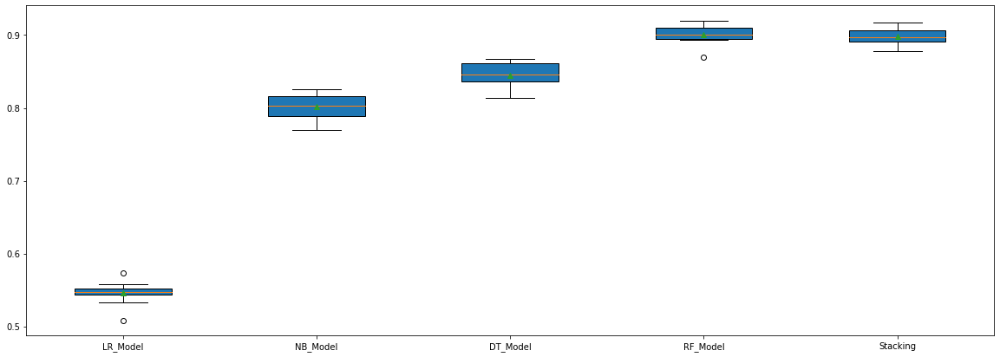

In [146]:
plt.figure(figsize=(20,7))
plt.boxplot(results, labels=names, showmeans=True,patch_artist = True)
plt.show()

In [151]:
compare = pd.DataFrame({"Model with CV":["LR_Model","NB_Model","DT_Model","RF_Model","stacking"],
                       "Accuracy Score":[s,s2,s3,s4,s5]})
compare

,Model with CV,Accuracy Score
0,LR_Model,0.545833
1,NB_Model,0.802000
2,DT_Model,0.844500
3,RF_Model,0.900000
4,stacking,0.898333


In [162]:
compare2 = pd.DataFrame({"Model without CV":["LR_Model","NB_Model","DT_Model","RF_Model","stacking"],
                        "Accuracy Score":[0.52,0.79,0.76,0.87,0.87]})
compare2

,Model without CV,Accuracy Score
0,LR_Model,0.52
1,NB_Model,0.79
2,DT_Model,0.76
3,RF_Model,0.87
4,stacking,0.87


# <div style = 'background-color:lightcyan'> <center> <font color='teal'>**Final Conclusion**</font>

- **Bagging with Random Forest and Stacking both models give good accuracy with cv that is 0.90 and with out cv that is 0.87**
- **But if we observe the comparison graph the data is properly distributed in stacking and there are no outliers but in Random Forest the data is not spread perfectly and outliers are also detected**







- **Using Stacking we can easily predict the houses based on their grade**  
- **If a client needs a house with 8 to 9 rooms with upto 8 washrooms Grade A house is the best house for them**
- **If client needs 5 to 6 rooms with upto 3 to 4 bathrooms Grade B would be a good choice for them**

